## Algorithms for phase retrieval
Simple implementations for 
* ER and HIO

*References:* <br>
- *Fienup [1982](http://ao.osa.org/abstract.cfm?URI=ao-21-15-2758)*<br>

In [183]:
%%capture
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
exec(open('../codes/zernike.py'))
exec(open('../codes/pr.py'))
%matplotlib inline

plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18

---
## Input (true images)
Maximum 20% aberrations in both amplitude and phase. Randomly generated in Zernike coefficients (first 15)

In [184]:
coeff1 = np.random.random(15)
coeff2 = np.random.random(15)
P,P_,F,F_ = true_imgs(Npix=256,coeff1=coeff1,coeff2=coeff2,oversamp=2)

#### Oversampling
Zero-pad the pupil plane (object domain) image to for oversampling of 2 (Miao+[1998](http://dx.doi.org/10.1364/JOSAA.15.001662))

In [185]:
test = PR(pup=P,foc=F,oversamp=2)

---
### Gerchberg-Saxton 
Two-image run. Constraints set by the amplitude (intensity) images in both domains.

_For 500 iterations_

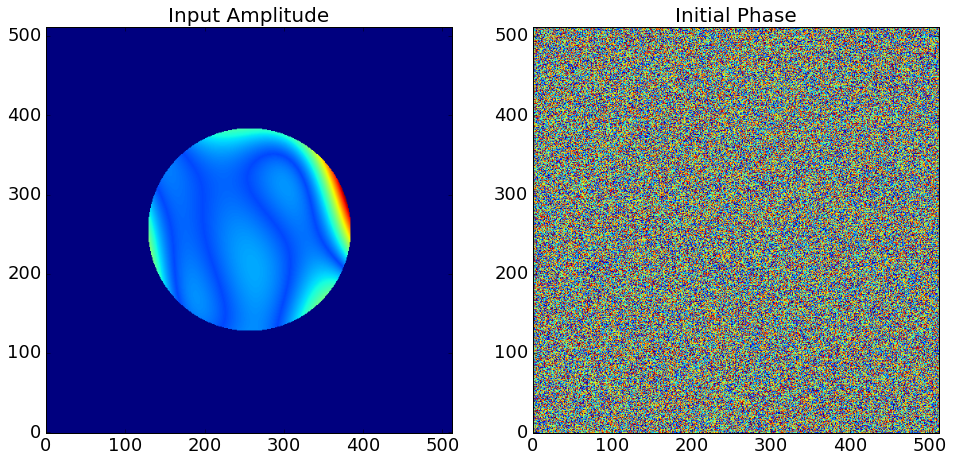

Current step : 100
        Error: 2.13e-04
Current step : 200
        Error: 2.06e-04
Current step : 300
        Error: 2.06e-04
Current step : 400
        Error: 2.06e-04
Current step : 500
        Error: 2.06e-04
Final step : 500
Final Error: 2.06e-04


In [164]:
test_pup,test_foc = test.GS()

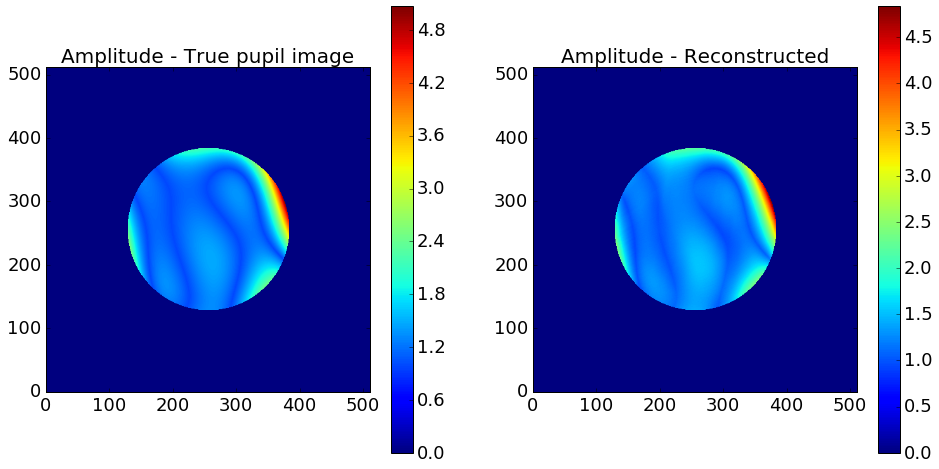

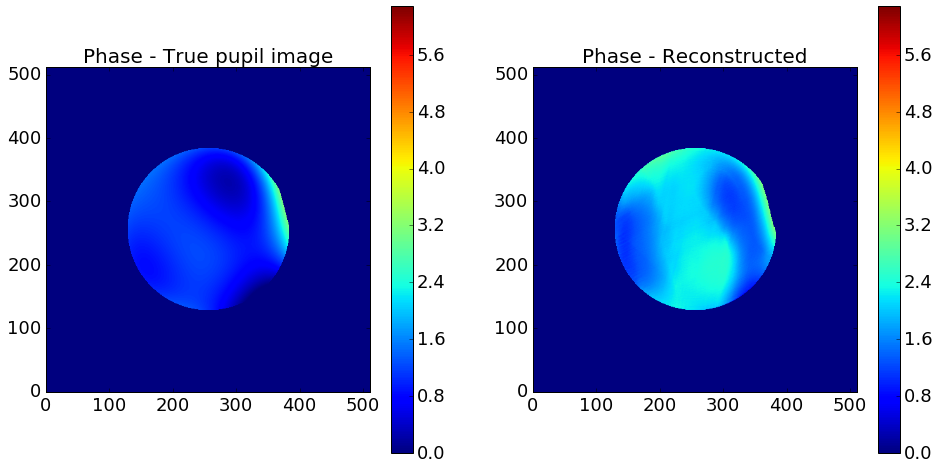

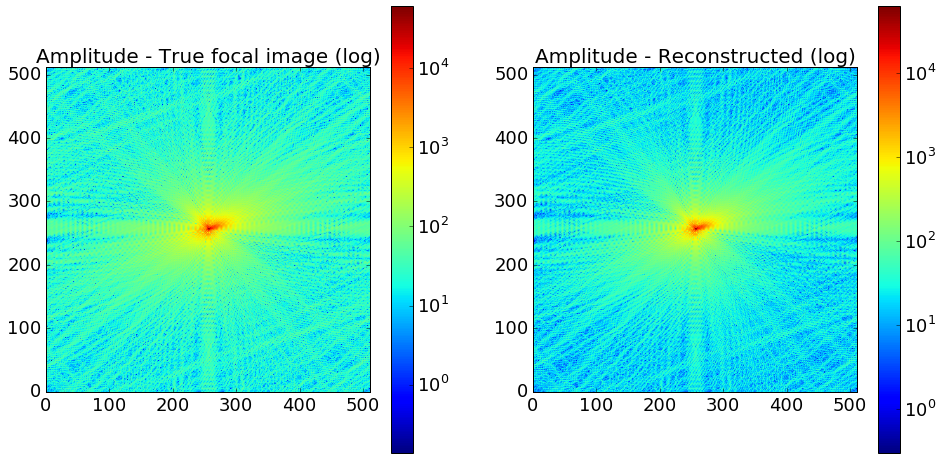

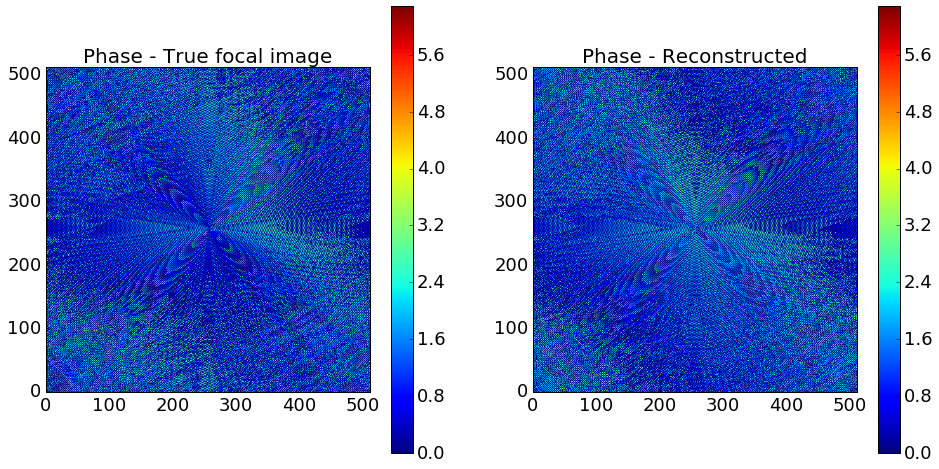

In [175]:
plot_recon(P_,F_,test_pup,test_foc)

Quite good. But remember that the phases can have an overall (constant) shift degeneracy. Their differences look like:

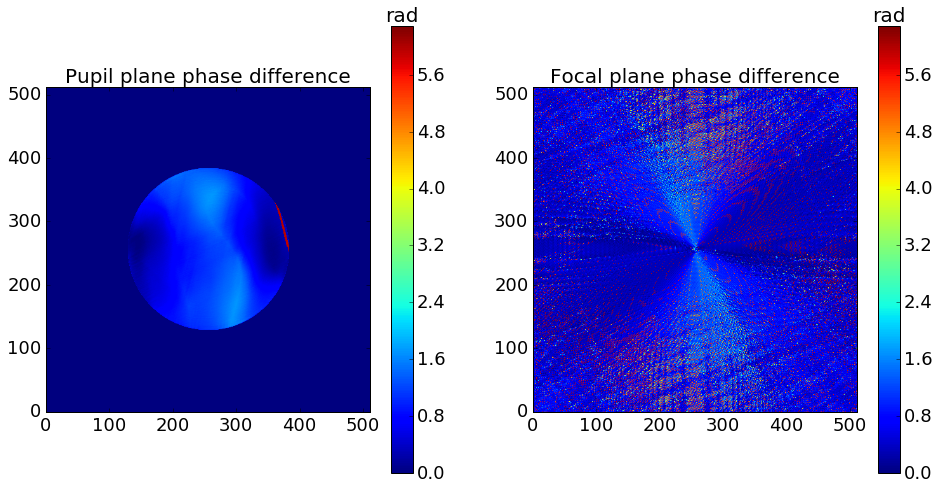

In [178]:
plot_phase_residual(P_,F_,test_pup,test_foc)

If everything is in the same color, then the process is perfect. In reality, we still see some 'cyan' patterns which indicate failure of complete reconstruction

---
### ER
Maximum number of iterations: 1000.
Without any positivity constraints (only support defined by the aperture)

Caution: Pupil image is not used for constraints.
         This is one-image process.


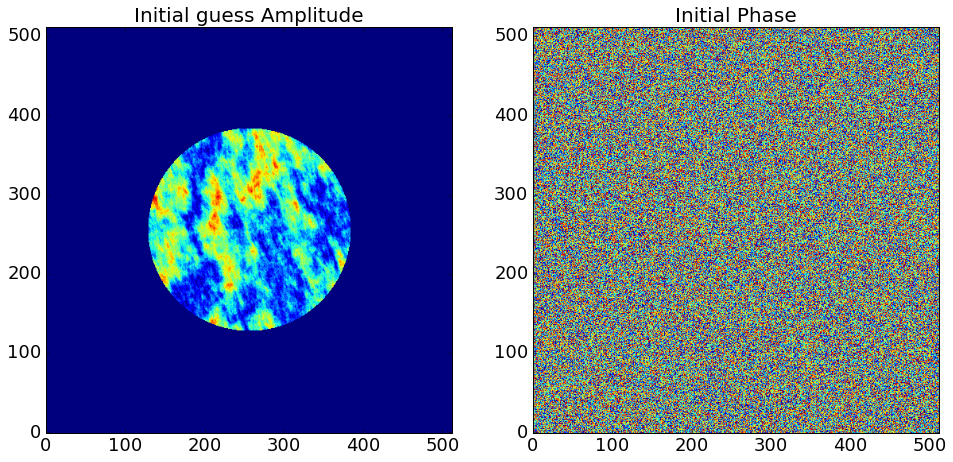

Current step : 100
        Error: 6.42e-04
Current step : 200
        Error: 5.69e-04
Current step : 300
        Error: 5.68e-04
Current step : 400
        Error: 5.68e-04
Current step : 500
        Error: 5.68e-04
Current step : 600
        Error: 5.68e-04
Current step : 700
        Error: 5.67e-04
Current step : 800
        Error: 5.67e-04
Current step : 900
        Error: 5.67e-04
Current step : 1000
        Error: 5.67e-04
-----------------------
First iteration error: 8.27e-03
Final step : 1000
Final Error: 5.67e-04


In [167]:
ER_pup,ER_foc,ER_errlist = test.ER(iterlim=1000)

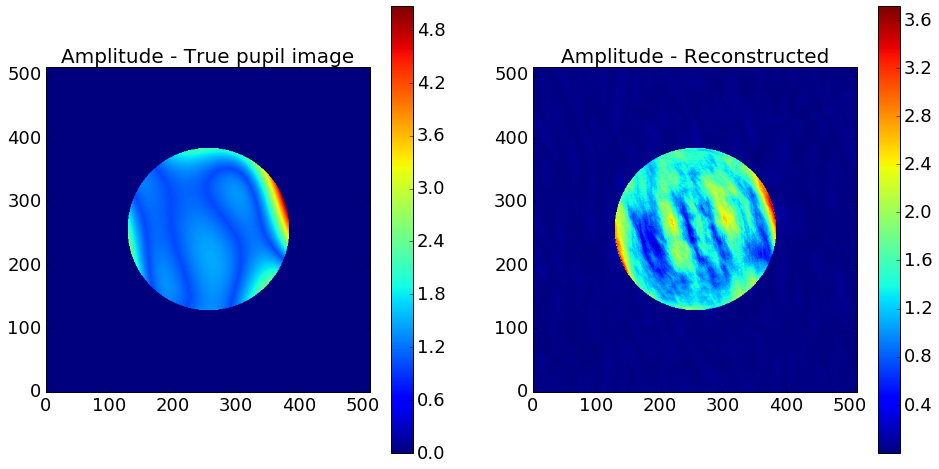

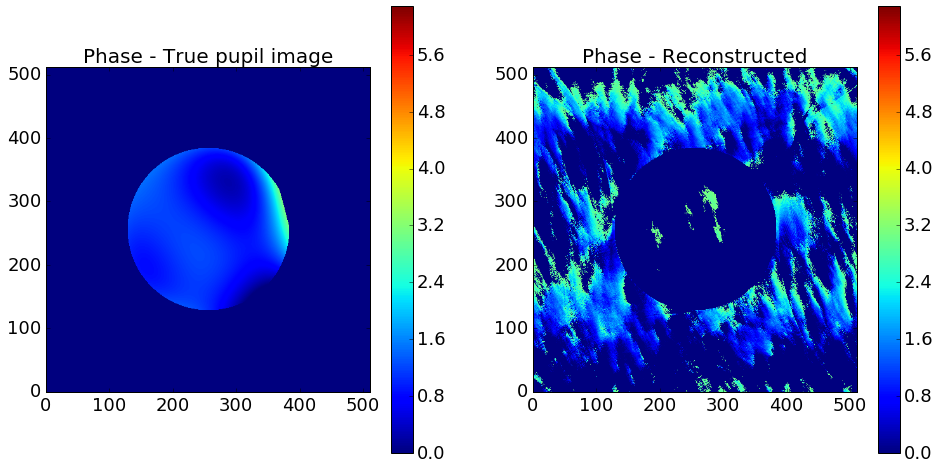

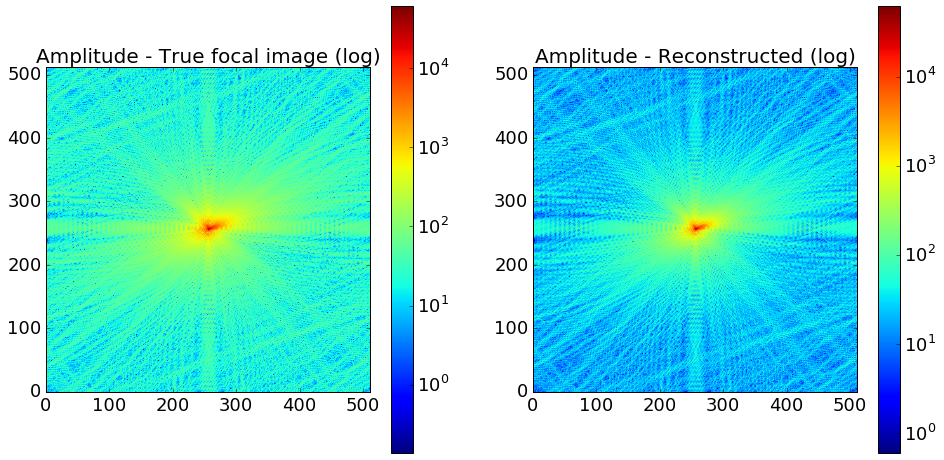

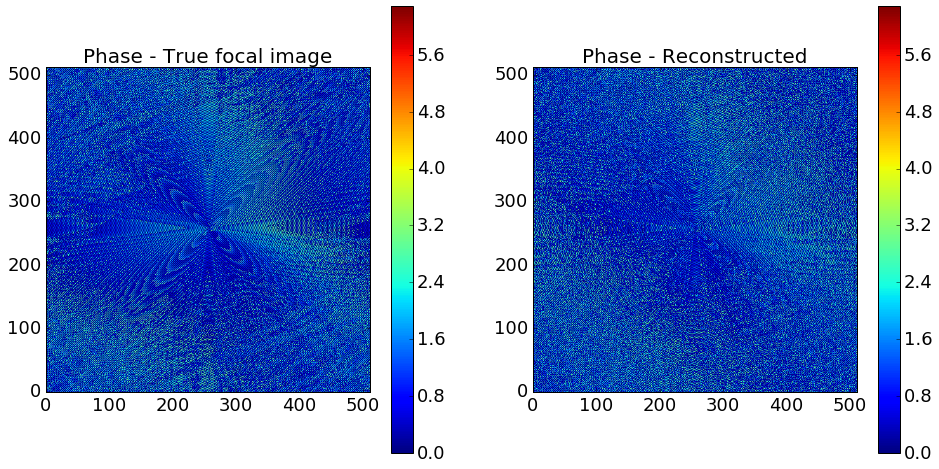

In [179]:
plot_recon(P_,F_,ER_pup,ER_foc)

It clearly does not fully recover the "true" images, as some small regions show very inconsistent colors between the left and right panels. Interestingly, a good convergence is still obtained (hence increasing iterations would not help much), so we almost proved it is not global:

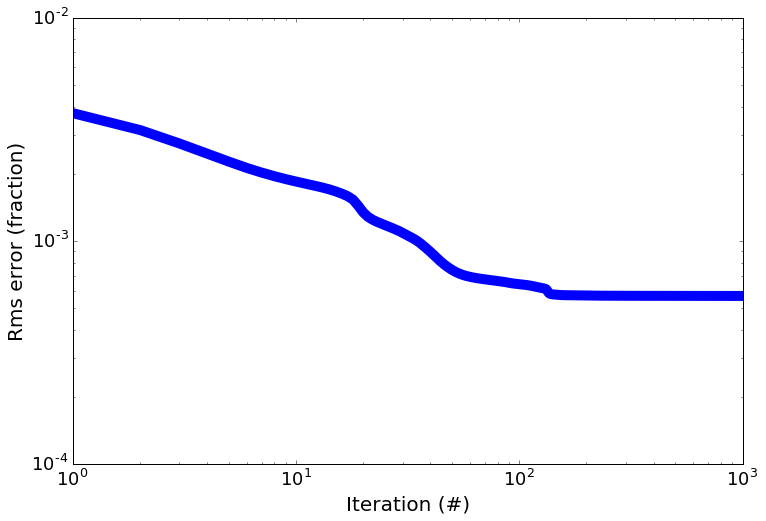

In [180]:
plot_errlist(ER_errlist)

---
### HIO
Same settings as ER
#### 1.  $\beta$= 0.5

Caution: Pupil image is not used for constraints.
         This is one-image process.


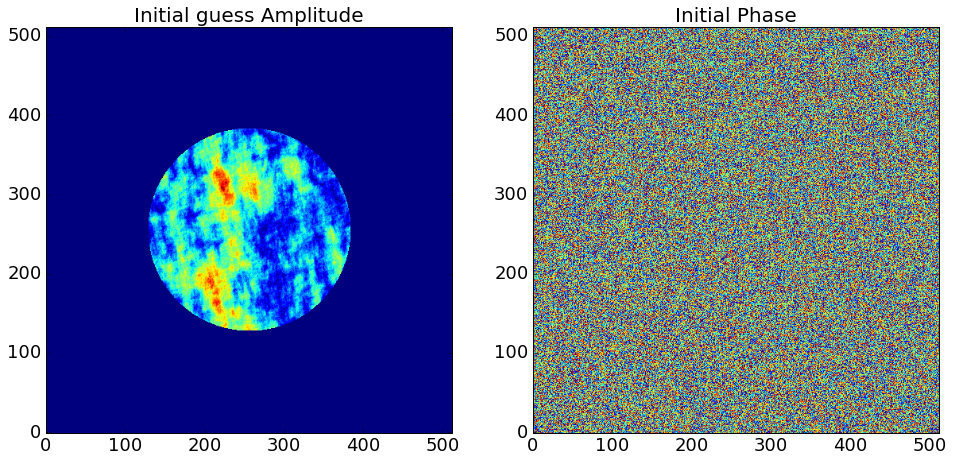

Current step : 100
        Error: 5.59e-03
Current step : 200
        Error: 5.94e-03
Current step : 300
        Error: 6.26e-03
Current step : 400
        Error: 6.56e-03
Current step : 500
        Error: 6.81e-03
Current step : 600
        Error: 7.08e-03
Current step : 700
        Error: 7.35e-03
Current step : 800
        Error: 7.41e-03
Current step : 900
        Error: 7.46e-03
Current step : 1000
        Error: 7.52e-03
-----------------------
First iteration error: 1.05e-02
Final step : 1000
Final Error: 7.52e-03


In [186]:
HIO_pup,HIO_foc,HIO_errlist = test.HIO(beta=0.5,iterlim=1000)

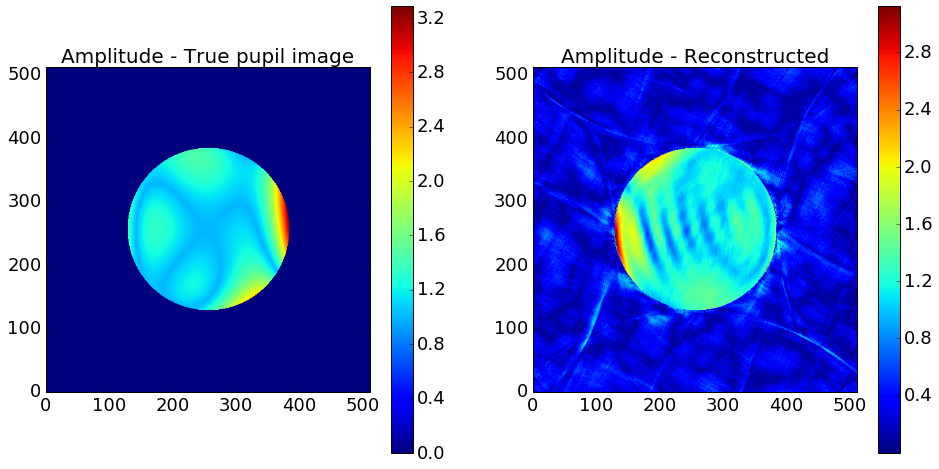

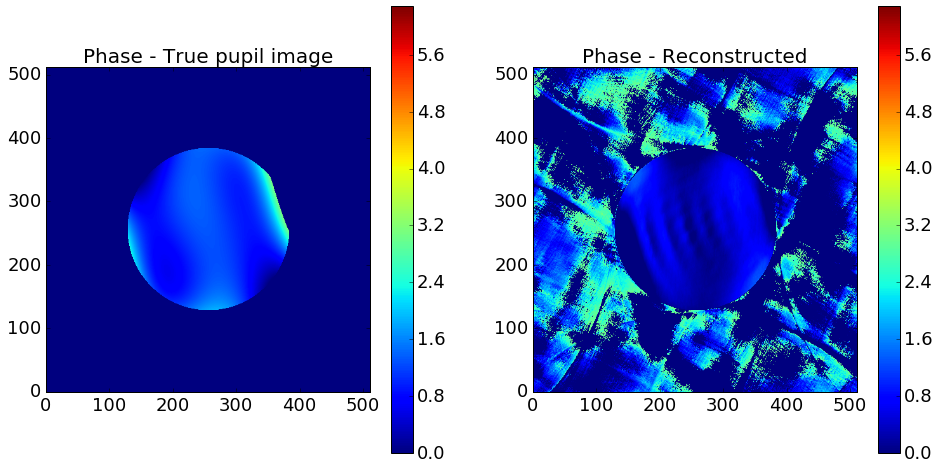

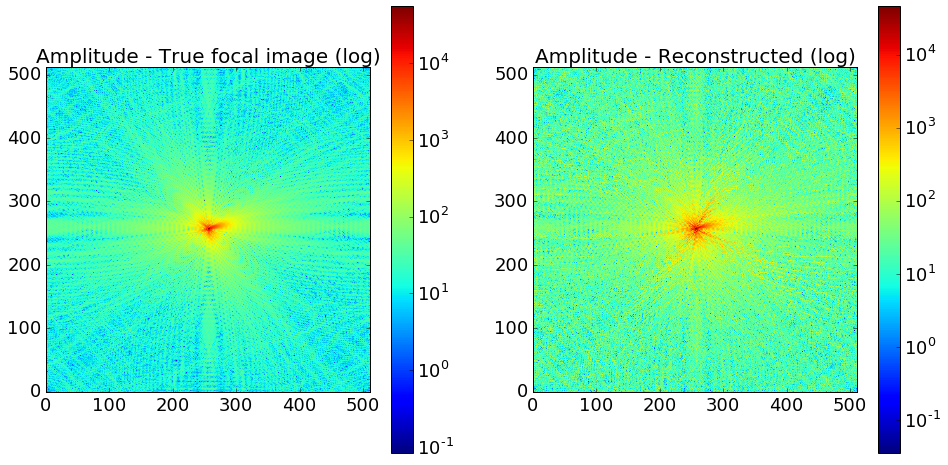

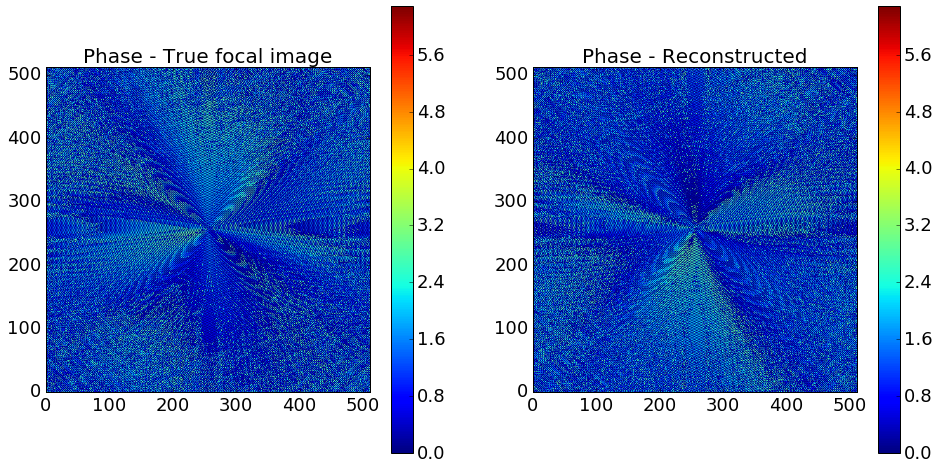

In [187]:
plot_recon(P_,F_,HIO_pup,HIO_foc)

Okay, looks like it jumped out from some valley and failed to converge well:

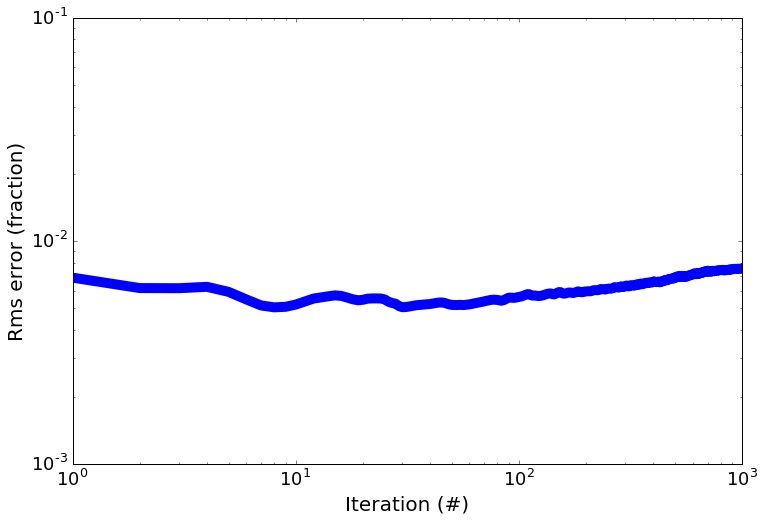

In [188]:
plot_errlist(HIO_errlist)

We shall try other $\beta$ choices:

#### 2. $\beta$ = 1

Caution: Pupil image is not used for constraints.
         This is one-image process.


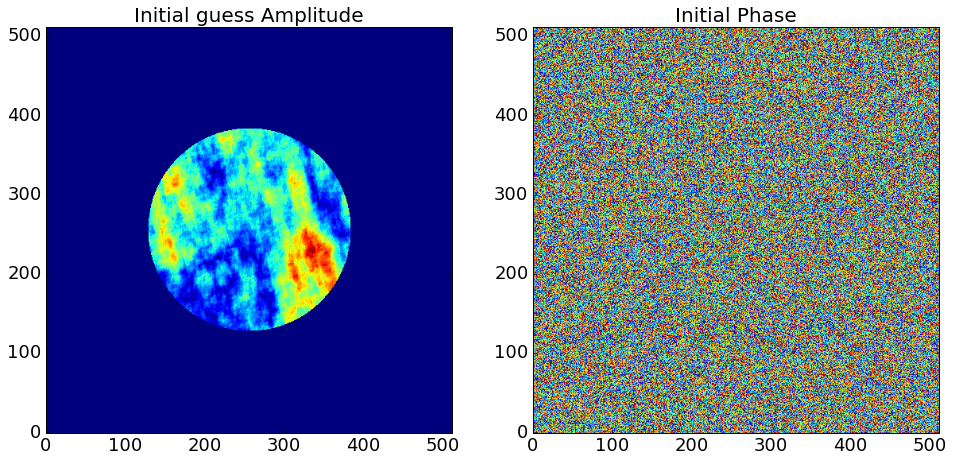

Current step : 100
        Error: 6.21e-03
Current step : 200
        Error: 6.88e-03
Current step : 300
        Error: 7.43e-03
Current step : 400
        Error: 7.64e-03
Current step : 500
        Error: 7.82e-03
Current step : 600
        Error: 7.99e-03
Current step : 700
        Error: 8.01e-03
Current step : 800
        Error: 7.67e-03
Current step : 900
        Error: 7.59e-03
Current step : 1000
        Error: 7.55e-03
-----------------------
First iteration error: 8.53e-03
Final step : 1000
Final Error: 7.55e-03


In [190]:
HIO_pup_1,HIO_foc_1,HIO_errlist_1 = test.HIO(beta=1.,iterlim=1000)

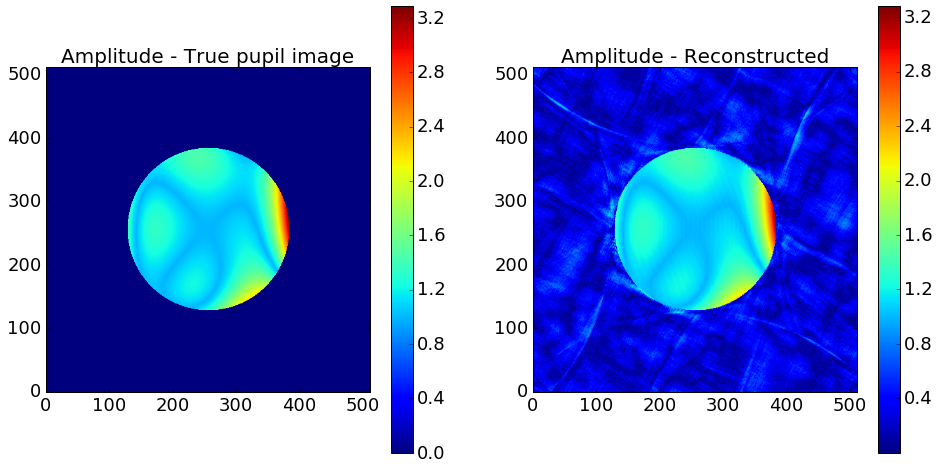

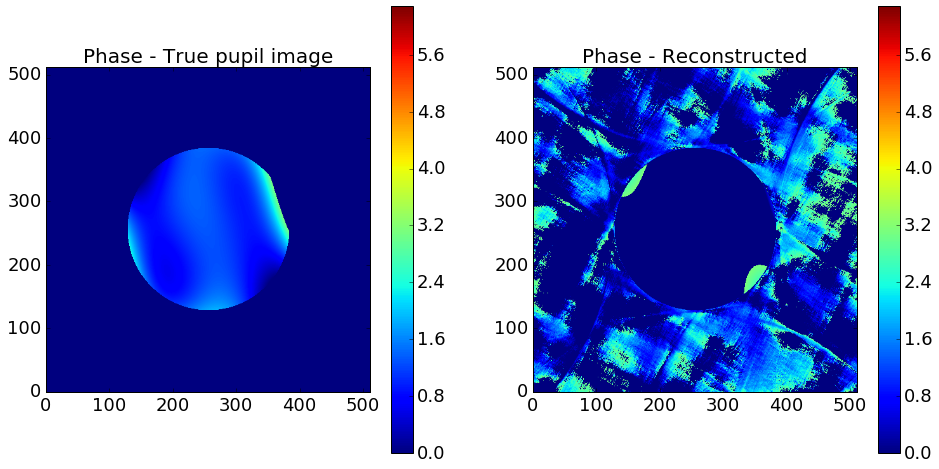

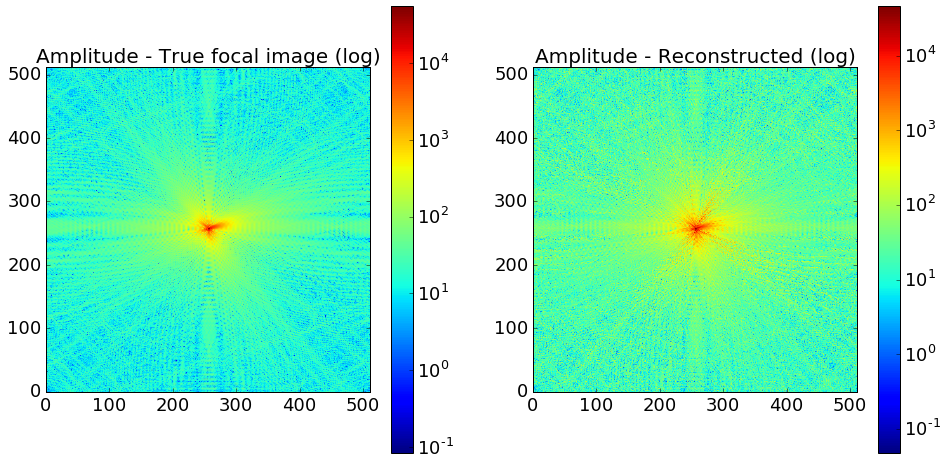

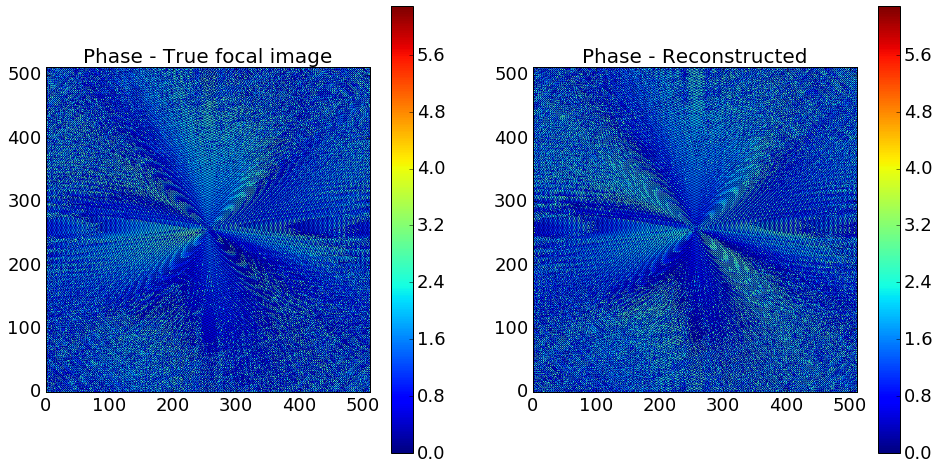

In [191]:
plot_recon(P_,F_,HIO_pup_1,HIO_foc_1)

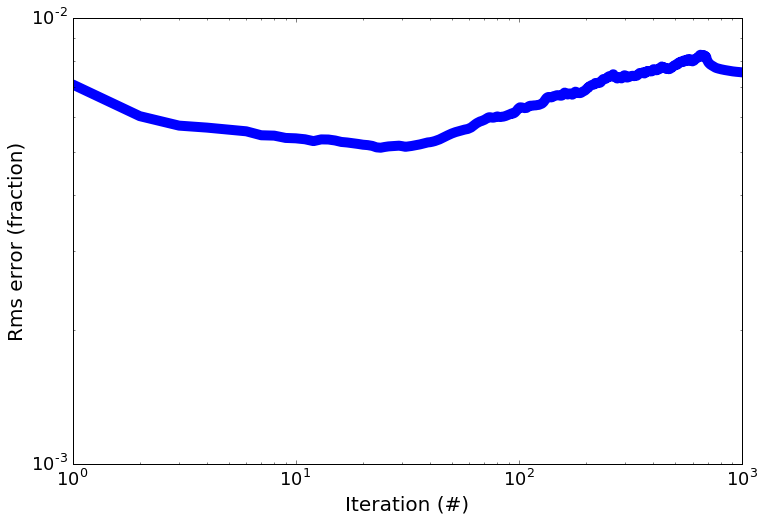

In [192]:
plot_errlist(HIO_errlist_1)

Intriguing. Error seems to be finding its way to a second convergence (decending trend), while the amplitude was already reconstructed pretty well. The errors most likely come from the "outside of support" region. How about a moderate $\beta$?

#### 3. $\beta$ = 0.7

Caution: Pupil image is not used for constraints.
         This is one-image process.


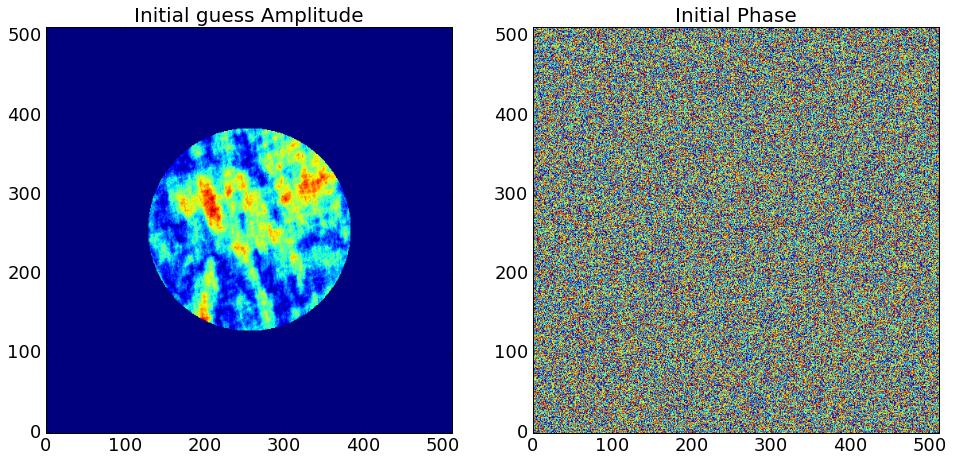

Current step : 100
        Error: 5.61e-03
Current step : 200
        Error: 6.14e-03
Current step : 300
        Error: 6.57e-03
Current step : 400
        Error: 6.98e-03
Current step : 500
        Error: 7.42e-03
Current step : 600
        Error: 7.44e-03
Current step : 700
        Error: 7.51e-03
Current step : 800
        Error: 7.68e-03
Current step : 900
        Error: 7.76e-03
Current step : 1000
        Error: 7.90e-03
-----------------------
First iteration error: 1.02e-02
Final step : 1000
Final Error: 7.90e-03


In [193]:
HIO_pup_07,HIO_foc_07,HIO_errlist_07 = test.HIO(beta=.7,iterlim=1000)

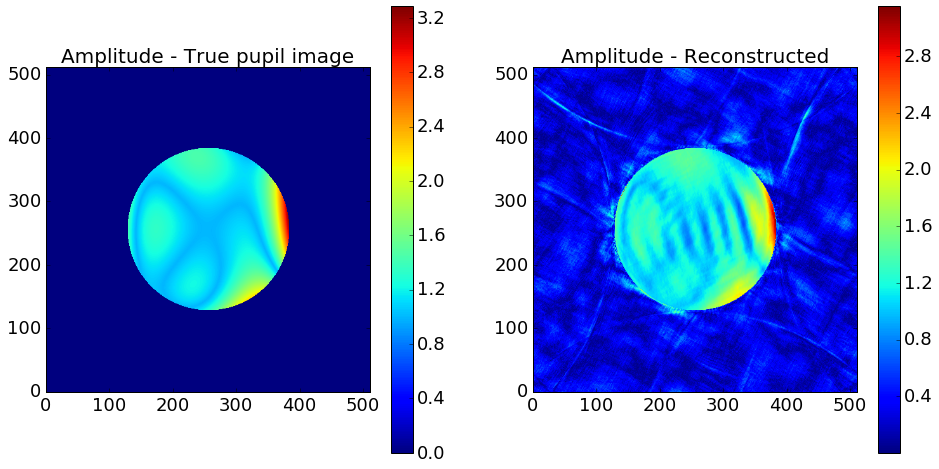

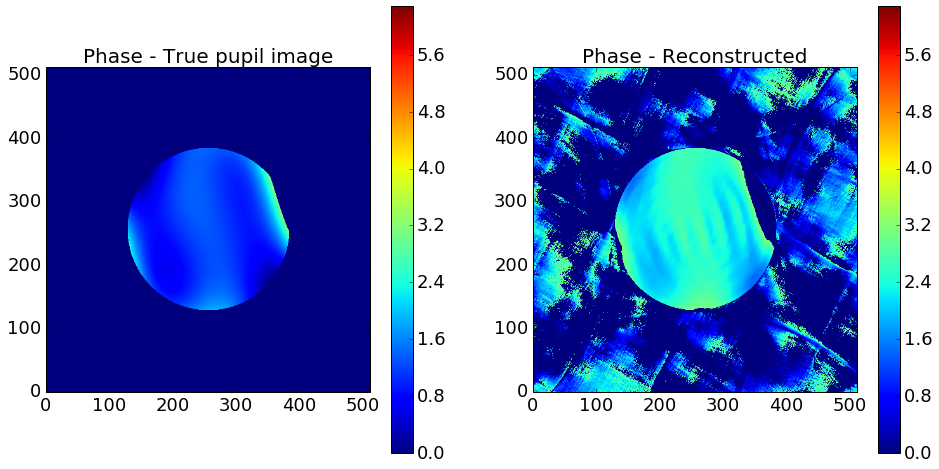

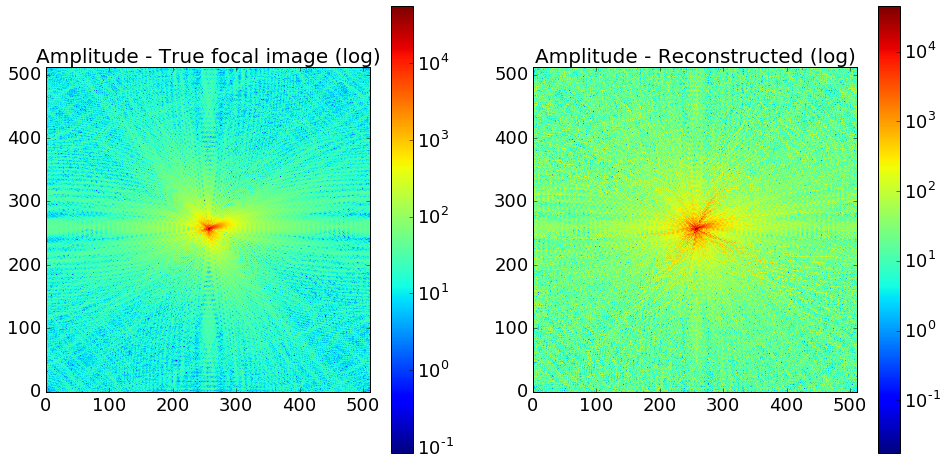

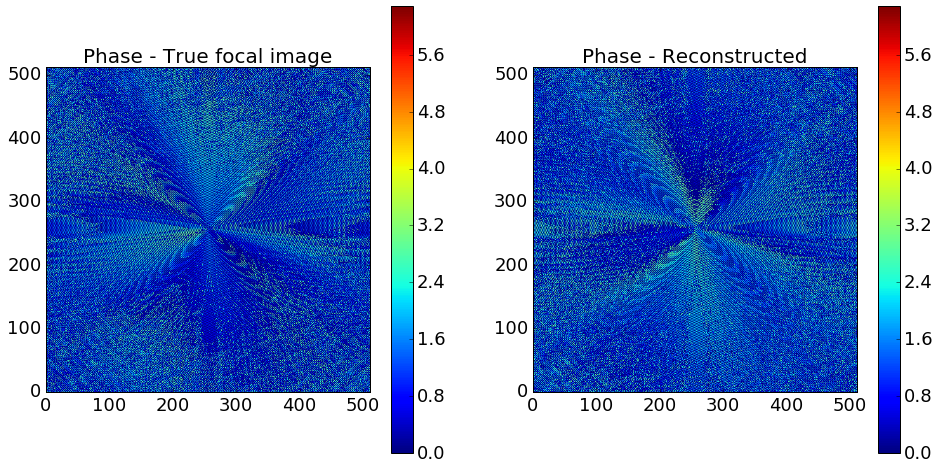

In [194]:
plot_recon(P_,F_,HIO_pup_07,HIO_foc_07)

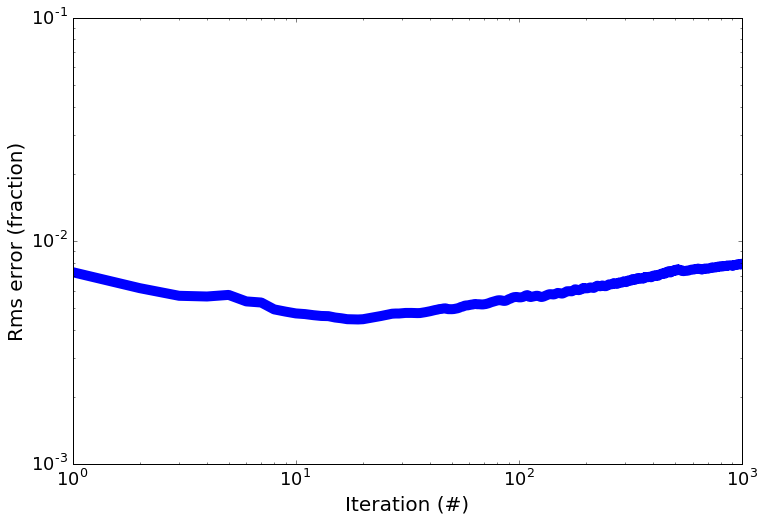

In [195]:
plot_errlist(HIO_errlist_07)

Despite some "fluctuations" remained in the recovered images, $\beta=1$ seems to produce better results. Let's compare the residual phase differences in the object (pupil) domain:

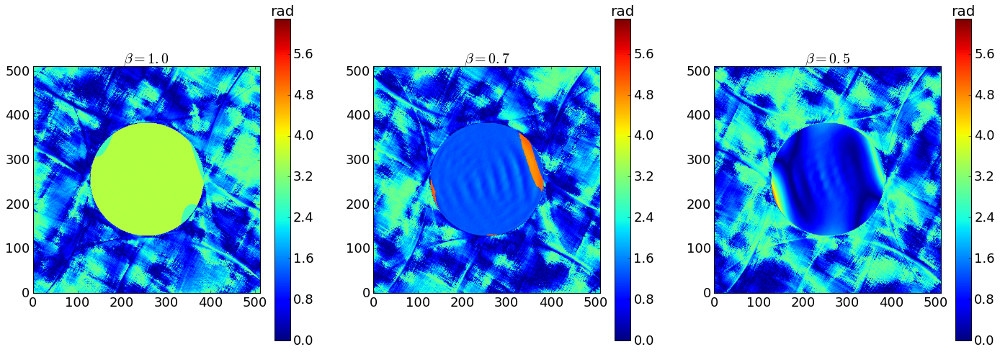

In [200]:
## true
Ppha = np.arctan2(P_.imag,P_.real)
    
## reconstructed (different betas)
rec_puppha_5 = np.arctan2(HIO_pup.imag,HIO_pup.real)
rec_puppha_1 = np.arctan2(HIO_pup_1.imag,HIO_pup_1.real)
rec_puppha_7 = np.arctan2(HIO_pup_07.imag,HIO_pup_07.real)

plt.figure(figsize=(24,8))
plt.subplot(131); plt.imshow(abs(Ppha-rec_puppha_1),origin='lower')
plt.title(r'$\beta=1.0$'); plt.clim(0,2*np.pi)
clb = plt.colorbar(); clb.ax.set_title('rad')
plt.subplot(132); plt.imshow(abs(Ppha-rec_puppha_7),origin='lower')
plt.title(r'$\beta=0.7$'); plt.clim(0,2*np.pi)
clb = plt.colorbar(); clb.ax.set_title('rad')
plt.subplot(133); plt.imshow(abs(Ppha-rec_puppha_5),origin='lower')
plt.title(r'$\beta=0.5$'); plt.clim(0,2*np.pi)
clb = plt.colorbar(); clb.ax.set_title('rad')

Many speculative residuals of $n\pi$ (for integral n). First guess is that taking `abs` value of a complex-valued image does not care about the sign (plus or minus) which stem from factors of $\exp(n\pi)$ in the phases. It is worth exploring how to get rid of this degeneracy. Apart from that, $\beta=1$ looks like the best.